In [1]:

from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
     

In [2]:
IMAGE_SIZE = [224, 224]

In [3]:
train_path = '/Users/anshu/gender_detection/train/'
test_path = '/Users/anshu/gender_detection/test/'

Working with 110 images
Image examples: 
63.jpg


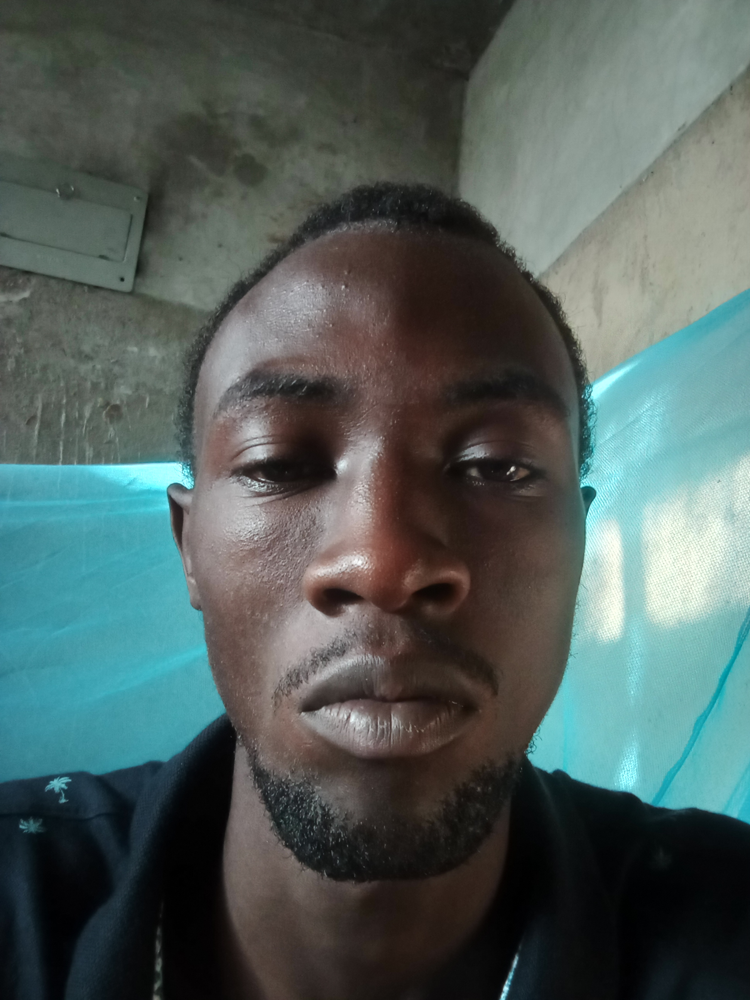

77.jpg


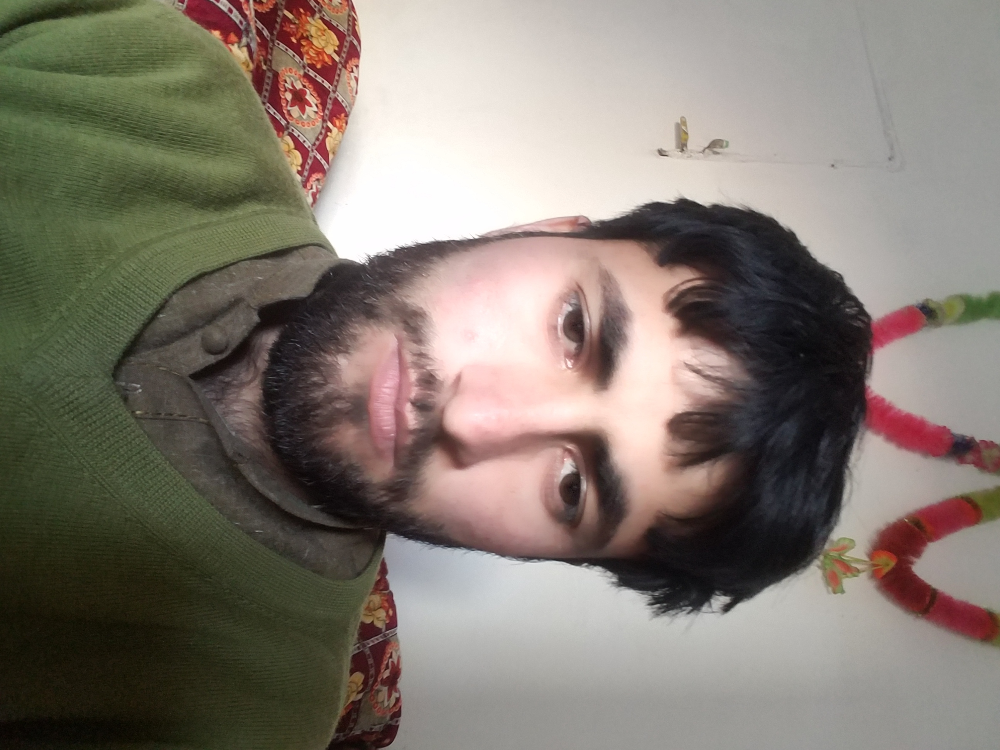

88.jpg


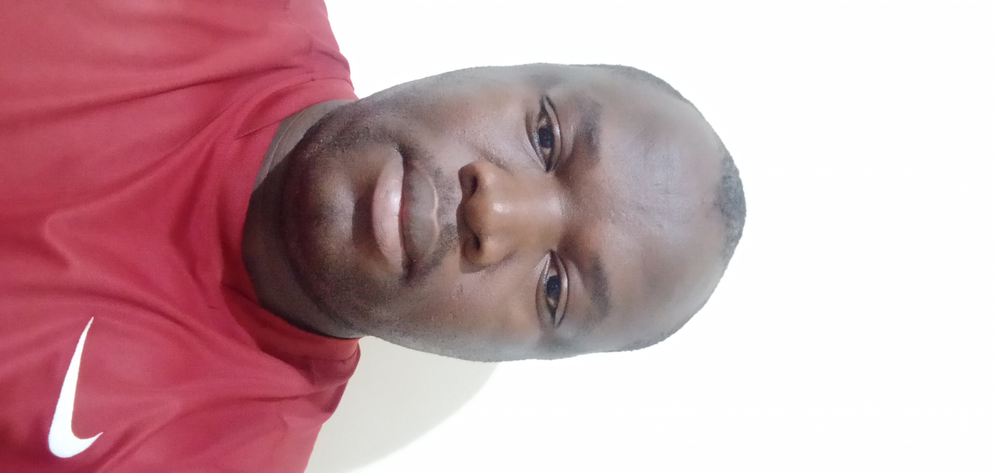

89.jpg


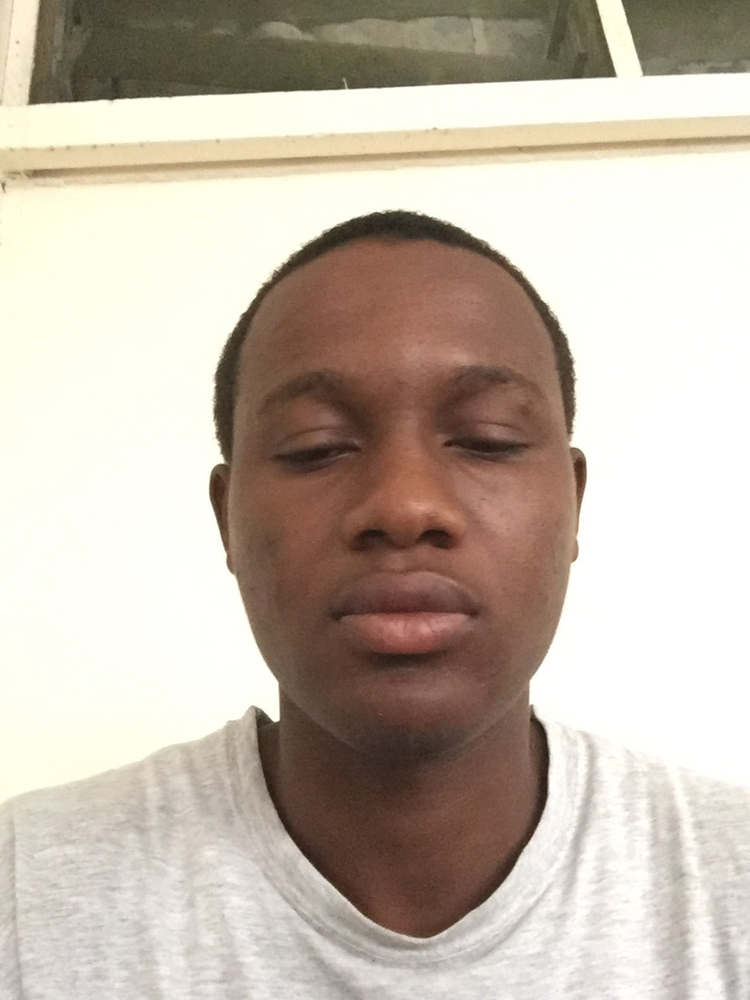

76.jpg


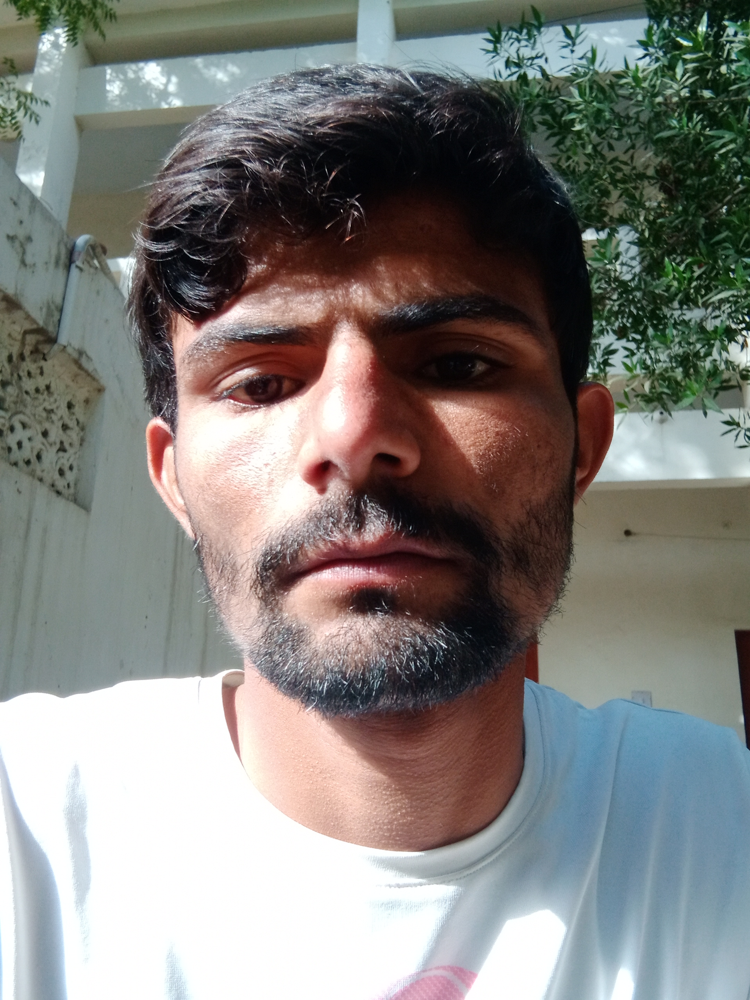

62.jpg


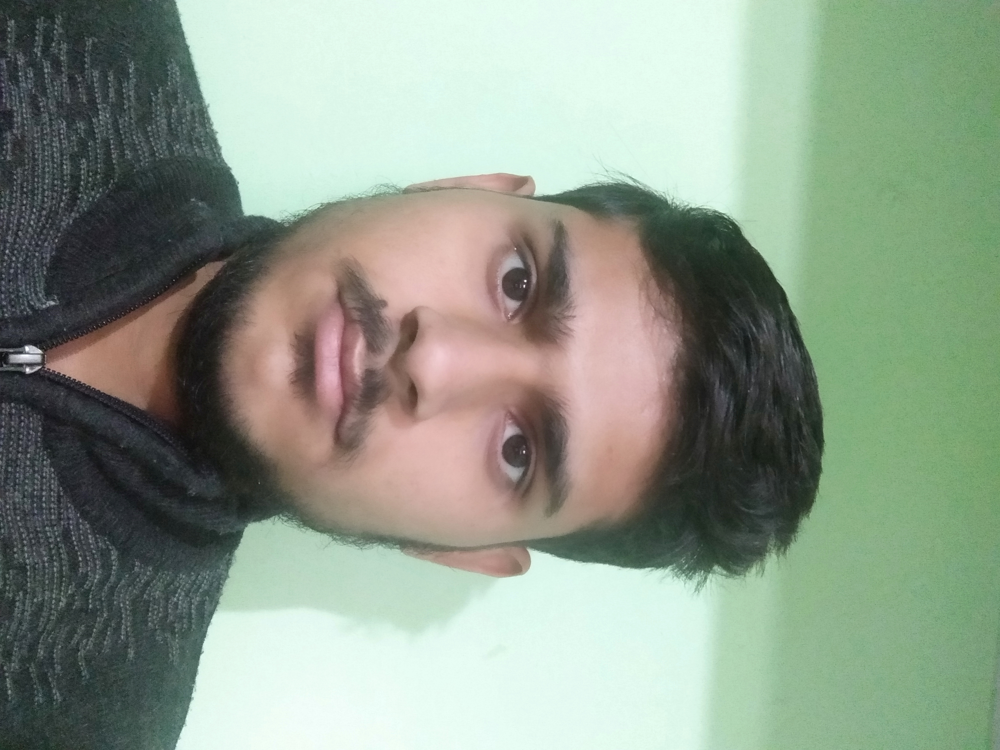

74.jpg


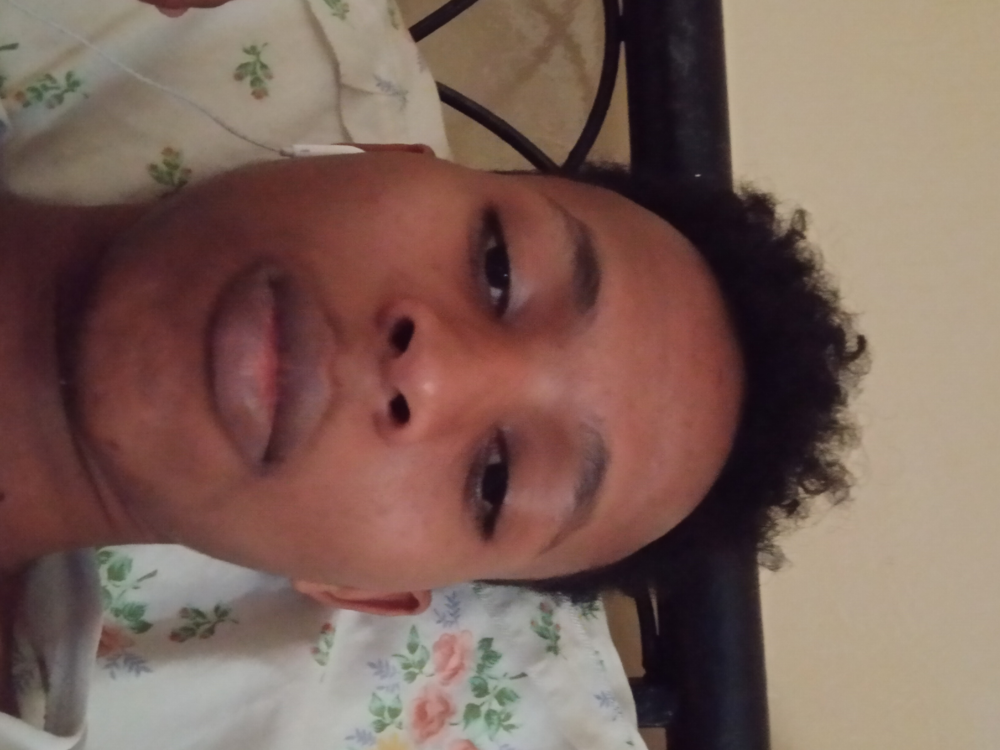

60.jpg


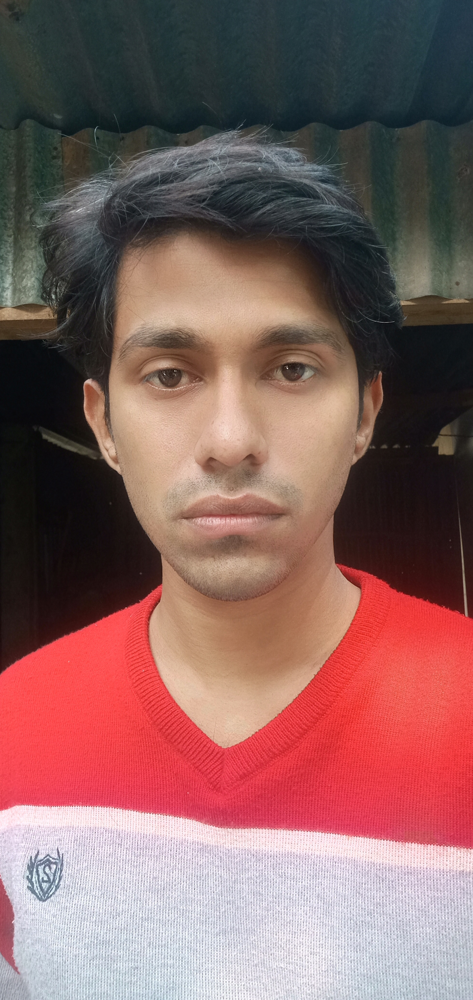

48.jpg


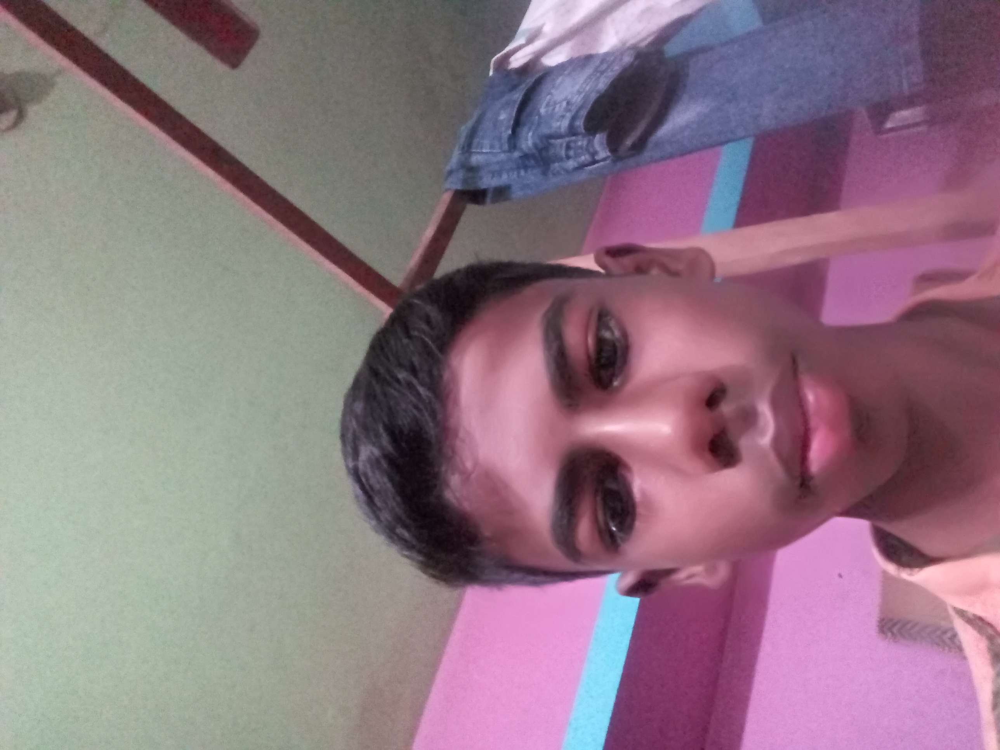

49.jpg


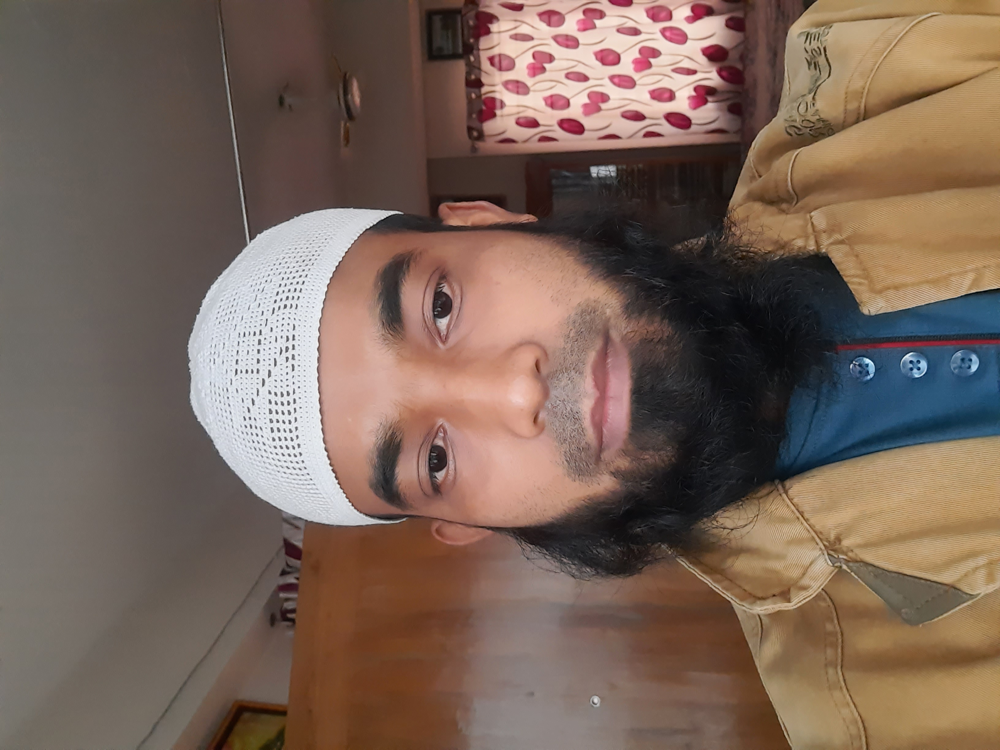

In [6]:
from PIL import Image 
import os 
from IPython.display import display
from IPython.display import Image as _Imgdis
# creating a object  

  
folder = train_path+'/men'


onlymen = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
print("Working with {0} images".format(len(onlymen)))
print("Image examples: ")
for i in range(10):
    print(onlymen[i])
    display(_Imgdis(filename=folder + "/" + onlymen[i], width=240, height=240))

In [8]:
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)
vgg.input
for layer in vgg.layers:
  layer.trainable = False
folders = glob('/Users/anshu/gender_detection/train/*')
print(len(folders))
x = Flatten()(vgg.output)
prediction = Dense(len(folders), activation='sigmoid')(x)
model = Model(inputs=vgg.input, outputs=prediction)
model.summary()

2
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [9]:
from keras import optimizers
adam = optimizers.Adam()
model.compile(loss='binary_crossentropy',optimizer=adam,metrics=['accuracy'])
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,rotation_range=40,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.2,zoom_range=0.2,horizontal_flip=True,fill_mode='nearest')
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,rotation_range=40,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.2,zoom_range=0.2,horizontal_flip=True,fill_mode='nearest')

In [11]:
train_set = train_datagen.flow_from_directory(train_path,target_size = (224, 224),batch_size = 32,class_mode = 'categorical')
test_set = test_datagen.flow_from_directory(test_path,target_size = (224, 224),batch_size = 32,class_mode = 'categorical')

Found 220 images belonging to 2 classes.
Found 80 images belonging to 2 classes.


In [ ]:
#import tensorflow as tf
#model.fit(train_set, epochs=10, validation_data=test_set)

In [12]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the checkpoint callback
checkpoint_filepath = 'best_model_checkpoint.h5'
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',  # Choose the metric to monitor (e.g., val_accuracy)
    mode='max',  # 'max' if the metric should be maximized, 'min' if minimized
    save_best_only=True,
    verbose=1
)

# Train the model with the callback
history = model.fit(
    train_set,
    epochs=10,
    validation_data=test_set,
    callbacks=[model_checkpoint_callback]
)


Epoch 1/10
7/7 [==============================] - ETA: 0s - loss: 5.7732 - accuracy: 0.5182
Epoch 1: val_accuracy improved from -inf to 0.57500, saving model to best_model_checkpoint.h5
7/7 [==============================] - 39s 6s/step - loss: 5.7732 - accuracy: 0.5182 - val_loss: 4.2485 - val_accuracy: 0.5750
Epoch 2/10
7/7 [==============================] - ETA: 0s - loss: 3.0814 - accuracy: 0.7227
Epoch 2: val_accuracy improved from 0.57500 to 0.72500, saving model to best_model_checkpoint.h5
7/7 [==============================] - 38s 6s/step - loss: 3.0814 - accuracy: 0.7227 - val_loss: 3.3303 - val_accuracy: 0.7250
Epoch 3/10
7/7 [==============================] - ETA: 0s - loss: 2.7691 - accuracy: 0.7545
Epoch 3: val_accuracy did not improve from 0.72500
7/7 [==============================] - 40s 6s/step - loss: 2.7691 - accuracy: 0.7545 - val_loss: 4.1135 - val_accuracy: 0.6625
Epoch 4/10
7/7 [==============================] - ETA: 0s - loss: 1.7159 - accuracy: 0.8136
Epoch 4: 

In [ ]:
#test_loss, test_accuracy = model.evaluate(test_set)
#print(f'Test Accuracy: {test_accuracy * 100:.2f}%')
#print(f'Test Loss: {test_loss:.4f}')

In [13]:
model.save('/Users/anshu/gender_detection/best_model_checkpoint.h5')

/Users/anshu/anaconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
